In [1]:

import pandas as pd                         # for data manipulation and analysis
import numpy as np                          # for scientific computing
import seaborn as sns                       # for data visualization
import matplotlib.pyplot as plt             # for data visualization
import nltk                                 # for natural language processing
from nltk.tokenize import word_tokenize     # for tokenizing strings
from nltk.corpus import stopwords           # for stopwords
from nltk.probability import FreqDist       # for frequency distribution
from bs4 import BeautifulSoup               # for removing html tags
import re                                   # for regular expressions
from langdetect import detect               # for detecting language
import emoji                                # for emojis
from wordcloud import WordCloud             # for wordcloud
from collections import Counter             # for counting

In [4]:
# Specifying the full path to the CSV file
file_path = "../../FineTunersAI/Data/output.csv"

# Reading the CSV file
df = pd.read_csv(file_path)
df.head(5)


,link,title,content
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,Sections Shows More Follow today More Brands T...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,Sections Shows More Follow today More Brands J...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,Sections Shows More Follow today More Brands H...


### **DATA UNDERSTANDING**

In [5]:
df.head(2)

,link,title,content
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,Sections Shows More Follow today More Brands O...
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Sections Shows More Follow today More Brands O...


In [6]:
print(df.info())
print("----------------------------------------------------")
print("Type of columns:")
print(df.dtypes)
print("----------------------------------------------------")
print("Shape of the dataframe:")
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   link     1190 non-null   object
 1   title    1190 non-null   object
 2   content  1190 non-null   object
dtypes: object(3)
memory usage: 28.0+ KB
None
----------------------------------------------------
Type of columns:
link       object
title      object
content    object
dtype: object
----------------------------------------------------
Shape of the dataframe:


(1190, 3)

In [78]:
# Printing the number of unique values
print("Total number of unique values in each column")
print(df.nunique())
print("----------------------------------------------------")
# Printing the number of missing values
print("Total number of missing values in each column is: ")
print(df.isnull().sum())

Total number of unique values in each column
link       279
title      279
content    279
dtype: int64
----------------------------------------------------
Total number of missing values in each column is: 
link       0
title      0
content    0
dtype: int64


In [79]:
# Finding duplicate rows in title column and printing the number of duplicate rows
print("Number of duplicate rows in link column is: ")
print(df.duplicated(subset=['link']).sum())
print("----------------------------------------------------")
print("Number of duplicate rows in content column is: ")
print(df.duplicated(subset=['content']).sum())
print("----------------------------------------------------")
print("Number of duplicate rows in title column is: ")
print(df.duplicated(subset=['title']).sum())

Number of duplicate rows in link column is: 
0
----------------------------------------------------
Number of duplicate rows in content column is: 
0
----------------------------------------------------
Number of duplicate rows in title column is: 
0


In [80]:
df["link"]

0      https://www.today.com/popculture/tv/chandler-b...
1      https://www.today.com/popculture/priscilla-pre...
2      https://www.today.com/popculture/books/what-to...
3      https://www.today.com/health/news/matthew-perr...
4      https://www.today.com/food/holidays/starbucks-...
                             ...                        
274    https://www.today.com/health/dex-carvey-son-da...
275    https://www.today.com/food/people/martha-stewa...
276    https://www.today.com/news/serena-williams-rub...
277    https://www.today.com/popculture/music/dolly-p...
278    https://www.today.com/popculture/tv/lauren-gra...
Name: link, Length: 279, dtype: object

In [81]:
# Creating a category column
df['category'] = df['link'].apply(lambda x: x.split('https://www.today.com/')[1].split('/')[0] if 'https://www.today.com/' in x else 'Unknown')

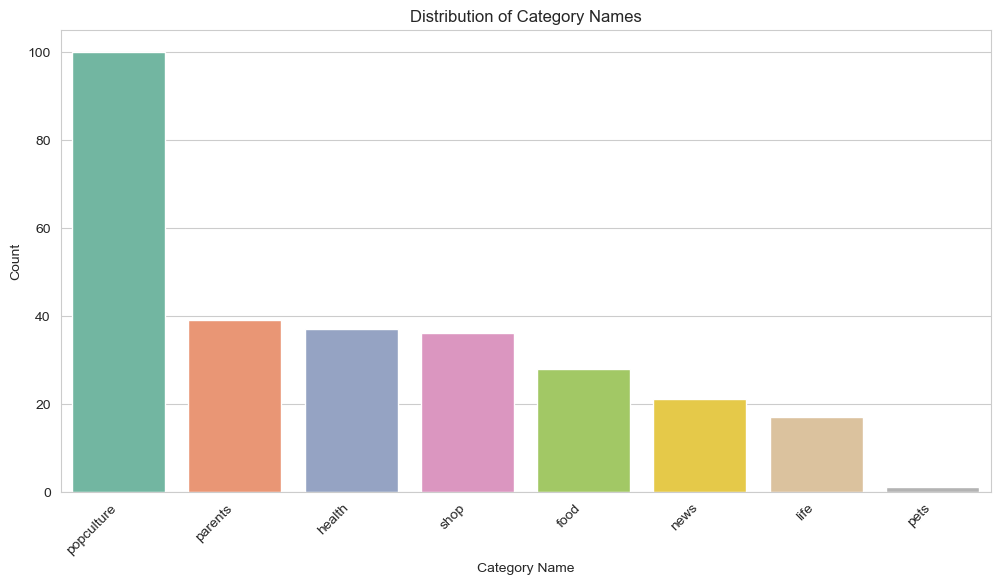

In [82]:
# Visualising the distribution of category names
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='category', order=df['category'].value_counts().index, palette="Set2")
plt.title('Distribution of Category Names')
plt.xlabel('Category Name')
plt.ylabel('Count')
plt.xticks(rotation=45, ha="right")
plt.show()

In [83]:
# Adding new columns named "title_length" and "content_length" to the dataframe
df['title_length'] = df['title'].apply(len)
df['content_length'] = df['content'].apply(len)
df.head(2)

,link,title,content,category,title_length,content_length
0,https://www.today.com/popculture/tv/chandler-b...,‘Friends’ fans honor late Matthew Perry by dre...,Sections Shows More Follow today More Brands “...,popculture,77,3858
1,https://www.today.com/popculture/priscilla-pre...,How old was Priscilla Presley when she met Elvis?,Sections Shows More Follow today More Brands S...,popculture,49,6701


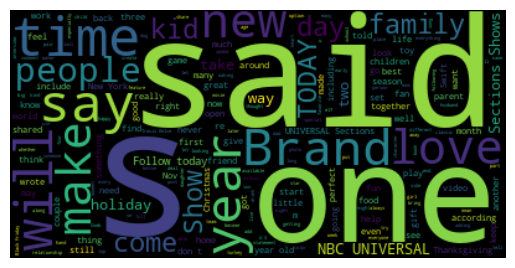

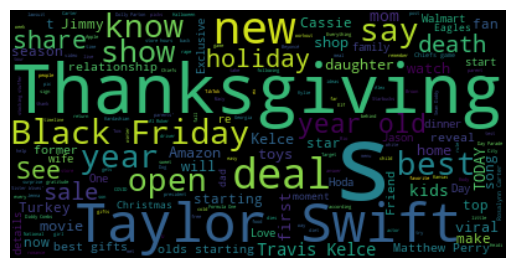

In [84]:
# Visualising most frequent words in the content column
wordcloud_content = WordCloud().generate(' '.join(df['content']))
plt.imshow(wordcloud_content, interpolation='bilinear')
plt.axis('off')
plt.show()

# Visualising most frequent words in the title column
wordcloud_title = WordCloud().generate(' '.join(df['title']))
plt.imshow(wordcloud_title, interpolation='bilinear')
plt.axis('off')
plt.show()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\MehmetCemAkuras\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


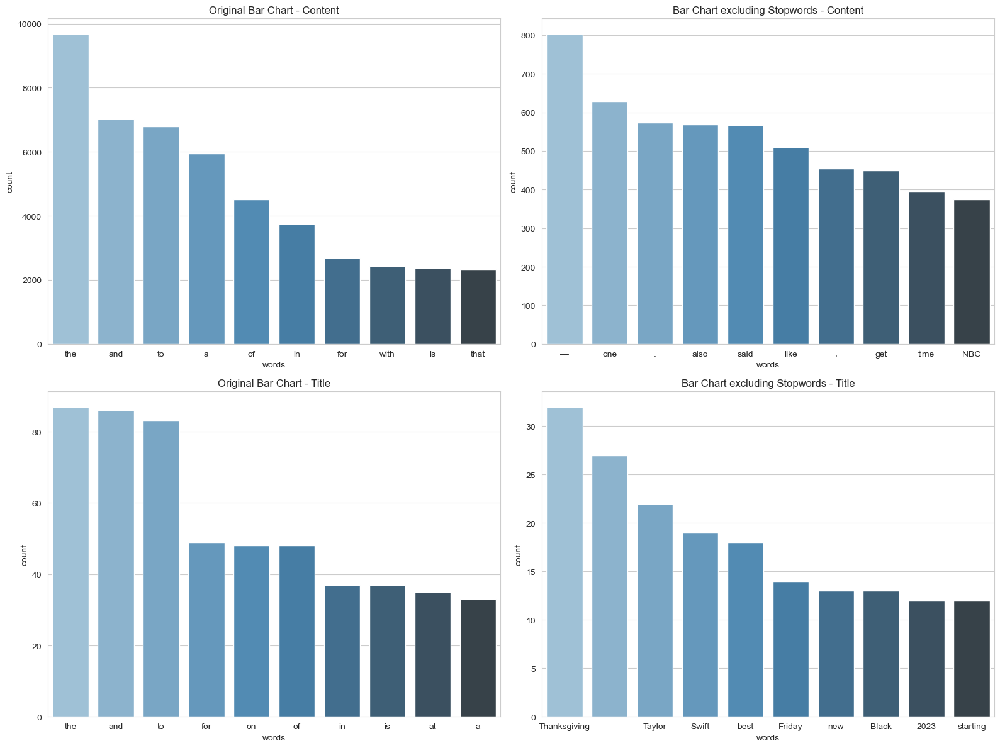

In [85]:
# Download the NLTK stopwords if not already downloaded
nltk.download('stopwords')

# Get the list of English stopwords
stop_words = set(stopwords.words('english'))

# Script 1: Original bar chart for "content" column
cnt1_content = Counter()
for text in df["content"].values:
    for word in text.split():
        cnt1_content[word] += 1

most_common_words1_content = cnt1_content.most_common(10)
most_common_words_df1_content = pd.DataFrame(most_common_words1_content, columns=['words', 'count'])

# Script 2: Bar chart excluding stopwords for "content" column
cnt2_content = Counter()
for text in df["content"].values:
    for word in text.split():
        if word.lower() not in stop_words:
            cnt2_content[word] += 1

most_common_words2_content = cnt2_content.most_common(10)
most_common_words_df2_content = pd.DataFrame(most_common_words2_content, columns=['words', 'count'])

# Script 3: Original bar chart for "title" column
cnt1_title = Counter()
for text in df["title"].values:
    for word in text.split():
        cnt1_title[word] += 1

most_common_words1_title = cnt1_title.most_common(10)
most_common_words_df1_title = pd.DataFrame(most_common_words1_title, columns=['words', 'count'])

# Script 4: Bar chart excluding stopwords for "title" column
cnt2_title = Counter()
for text in df["title"].values:
    for word in text.split():
        if word.lower() not in stop_words:
            cnt2_title[word] += 1

most_common_words2_title = cnt2_title.most_common(10)
most_common_words_df2_title = pd.DataFrame(most_common_words2_title, columns=['words', 'count'])

# Plotting side by side
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot for Script 1 - Content
sns.barplot(x="words", y="count", data=most_common_words_df1_content, palette="Blues_d", ax=axes[0, 0])
axes[0, 0].set_title('Original Bar Chart - Content')

# Plot for Script 2 - Content
sns.barplot(x="words", y="count", data=most_common_words_df2_content, palette="Blues_d", ax=axes[0, 1])
axes[0, 1].set_title('Bar Chart excluding Stopwords - Content')

# Plot for Script 3 - Title
sns.barplot(x="words", y="count", data=most_common_words_df1_title, palette="Blues_d", ax=axes[1, 0])
axes[1, 0].set_title('Original Bar Chart - Title')

# Plot for Script 4 - Title
sns.barplot(x="words", y="count", data=most_common_words_df2_title, palette="Blues_d", ax=axes[1, 1])
axes[1, 1].set_title('Bar Chart excluding Stopwords - Title')

plt.tight_layout()
plt.show()


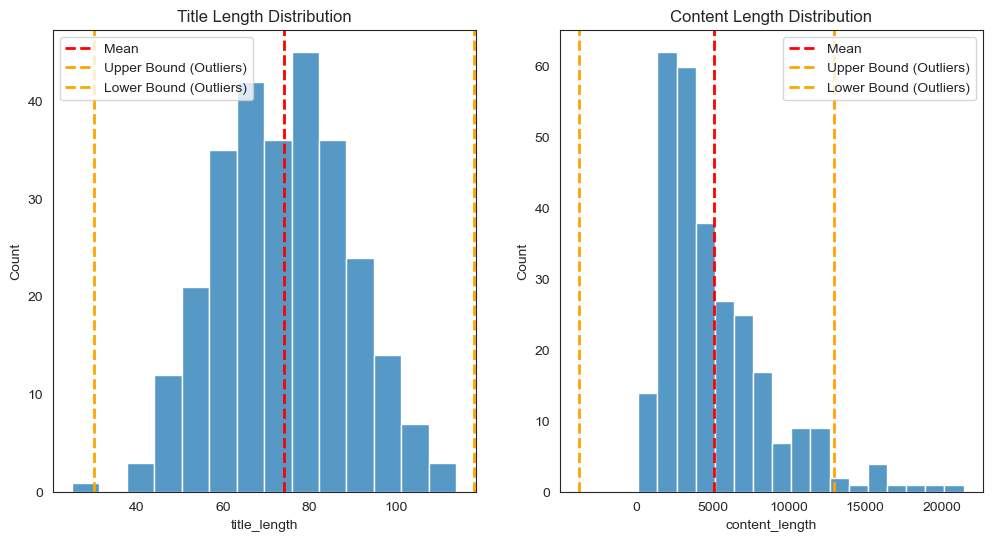

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline
sns.set_style('white')

# Assuming df is your DataFrame
# Calculate IQR for title_length and content_length
title_length_iqr = np.percentile(df['title_length'], 75) - np.percentile(df['title_length'], 25)
content_length_iqr = np.percentile(df['content_length'], 75) - np.percentile(df['content_length'], 25)

# Define the upper and lower bounds for outliers
title_length_upper_bound = np.percentile(df['title_length'], 75) + 1.5 * title_length_iqr
title_length_lower_bound = np.percentile(df['title_length'], 25) - 1.5 * title_length_iqr

content_length_upper_bound = np.percentile(df['content_length'], 75) + 1.5 * content_length_iqr
content_length_lower_bound = np.percentile(df['content_length'], 25) - 1.5 * content_length_iqr

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['title_length'])
plt.axvline(df['title_length'].mean(), color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(title_length_upper_bound, color='orange', linestyle='dashed', linewidth=2, label='Upper Bound (Outliers)')
plt.axvline(title_length_lower_bound, color='orange', linestyle='dashed', linewidth=2, label='Lower Bound (Outliers)')
plt.title('Title Length Distribution')
plt.legend(loc='upper left')  # Move legend to the top-left corner

plt.subplot(1, 2, 2)
sns.histplot(df['content_length'])
plt.axvline(df['content_length'].mean(), color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(content_length_upper_bound, color='orange', linestyle='dashed', linewidth=2, label='Upper Bound (Outliers)')
plt.axvline(content_length_lower_bound, color='orange', linestyle='dashed', linewidth=2, label='Lower Bound (Outliers)')
plt.title('Content Length Distribution')
plt.legend()

plt.show()

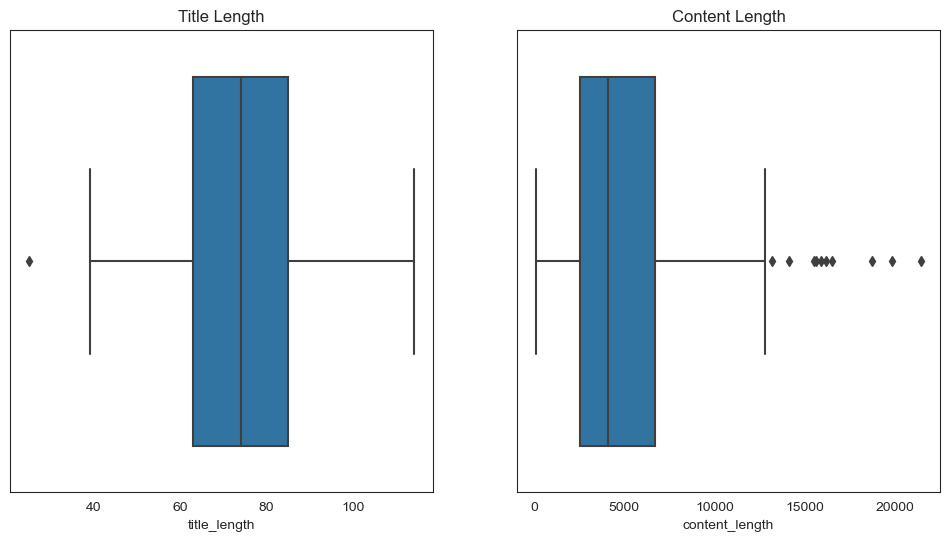

----------------------------------------------------
Number of outliers in title_length: 1
Number of outliers in content_length: 10


In [87]:
#Draw a boxplot for title_length and content_length
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=df['title_length'])
plt.title('Title Length')

plt.subplot(1, 2, 2)
sns.boxplot(x=df['content_length'])
plt.title('Content Length')

plt.show()

print('----------------------------------------------------')

#Print the number of outliers in title_length and content_length
print('Number of outliers in title_length: {}'.format(len(df[df['title_length'] > title_length_upper_bound]) + len(df[df['title_length'] < title_length_lower_bound])))
print('Number of outliers in content_length: {}'.format(len(df[df['content_length'] > content_length_upper_bound]) + len(df[df['content_length'] < content_length_lower_bound])))

In [92]:
df.head(2)

,link,title,content,category,title_length,content_length
0,https://www.today.com/popculture/tv/chandler-b...,‘Friends’ fans honor late Matthew Perry by dre...,Sections Shows More Follow today More Brands “...,popculture,77,3858
1,https://www.today.com/popculture/priscilla-pre...,How old was Priscilla Presley when she met Elvis?,Sections Shows More Follow today More Brands S...,popculture,49,6701


### **DATA CLEANING**

In [89]:
df_to_clean = df.copy()
df_to_clean.head(5)

# code to remove a particular substring from the content column
substring_to_remove = 'Sections Shows More Follow Today More Brands'
df_to_clean['cleaned_content'] = df_to_clean['content'].str.replace(substring_to_remove, '', case=False)
df_to_clean

,link,title,content,cleaned_content
0,https://www.today.com/popculture/tv/chandler-b...,‘Friends’ fans honor late Matthew Perry by dre...,Sections Shows More Follow today More Brands “...,“Friends” fans are paying tribute to the late...
1,https://www.today.com/popculture/priscilla-pre...,How old was Priscilla Presley when she met Elvis?,Sections Shows More Follow today More Brands S...,Sofia Coppola’s new biographical drama “Prisc...
2,https://www.today.com/popculture/books/what-to...,The best books to read in November 2023,Sections Shows More Follow today More Brands T...,"Turns out Jeff Kinney, creator of the bestsel..."
3,https://www.today.com/health/news/matthew-perr...,Matthew Perry’s death in hot tub puts spotligh...,Sections Shows More Follow today More Brands M...,Matthew Perry’s apparent at his house in Lo...
4,https://www.today.com/food/holidays/starbucks-...,33 Starbucks holiday drinks to try — from Hot ...,Sections Shows More Follow today More Brands R...,Ready to sip on something special this season...
...,...,...,...,...
274,https://www.today.com/health/dex-carvey-son-da...,"Dex Carvey, son of comedian Dana Carvey, dies ...",Sections Shows More Follow today More Brands D...,"Dex Carvey, the 32-year-old son of comedian D..."
275,https://www.today.com/food/people/martha-stewa...,"Why Martha Stewart, queen of Thanksgiving, can...",Sections Shows More Follow today More Brands D...,"Despite leading with her on Thursday, s..."
276,https://www.today.com/news/serena-williams-rub...,Serena Williams and Ruby Bridges to be inducte...,Sections Shows More Follow today More Brands S...,Serena Williams and Ruby Bridges will be indu...
277,https://www.today.com/popculture/music/dolly-p...,How Dolly Parton became Miley Cyrus’ godmother...,Sections Shows More Follow today More Brands I...,"It’s no secret that Dolly Parton , Miley Cyr..."


In [90]:
# dropping the content column which is not cleaned
col_to_drop = ['content']
df_to_clean.drop(columns=col_to_drop,inplace=True)
df_to_clean

,link,title,cleaned_content
0,https://www.today.com/popculture/tv/chandler-b...,‘Friends’ fans honor late Matthew Perry by dre...,“Friends” fans are paying tribute to the late...
1,https://www.today.com/popculture/priscilla-pre...,How old was Priscilla Presley when she met Elvis?,Sofia Coppola’s new biographical drama “Prisc...
2,https://www.today.com/popculture/books/what-to...,The best books to read in November 2023,"Turns out Jeff Kinney, creator of the bestsel..."
3,https://www.today.com/health/news/matthew-perr...,Matthew Perry’s death in hot tub puts spotligh...,Matthew Perry’s apparent at his house in Lo...
4,https://www.today.com/food/holidays/starbucks-...,33 Starbucks holiday drinks to try — from Hot ...,Ready to sip on something special this season...
...,...,...,...
274,https://www.today.com/health/dex-carvey-son-da...,"Dex Carvey, son of comedian Dana Carvey, dies ...","Dex Carvey, the 32-year-old son of comedian D..."
275,https://www.today.com/food/people/martha-stewa...,"Why Martha Stewart, queen of Thanksgiving, can...","Despite leading with her on Thursday, s..."
276,https://www.today.com/news/serena-williams-rub...,Serena Williams and Ruby Bridges to be inducte...,Serena Williams and Ruby Bridges will be indu...
277,https://www.today.com/popculture/music/dolly-p...,How Dolly Parton became Miley Cyrus’ godmother...,"It’s no secret that Dolly Parton , Miley Cyr..."


In [85]:
# printing the values
print(df_to_clean.values)

[['https://www.today.com/food/news/applebees-dollarita-returns-rcna118096'
  'Applebee’s brings back fan-favorite menu item after more than 3 years'
  ' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita® it is finally back!” an Applebee’s 

In [86]:
# function to remove special characters, emojis, non-breaking space and non-alphanumeric symbols
import re
import emoji
import pandas as pd

def clean_text(text):
    # Remove special characters, emojis, non-alphanumeric symbols, and non-breaking space
    cleaned_text = re.sub(r'[^a-zA-Z0-9\s.]', '', text)
    cleaned_text = re.sub(r'[\xa0]', ' ', cleaned_text)
    cleaned_text = emoji.get_emoji_regexp().sub('', cleaned_text)
    return cleaned_text


df_to_clean['cleaned_text'] = df_to_clean['cleaned_content'].apply(clean_text)

# Display the cleaned DataFrame
print(df_to_clean[['cleaned_content', 'cleaned_text']].values)


/var/folders/zt/cqc8pg4n6xd9pr6shs3vbzfm0000gn/T/ipykernel_1333/2724508677.py:9: DeprecationWarning: 'emoji.get_emoji_regexp()' is deprecated and will be removed in version 2.0.0. If you want to remove emoji from a string, consider the method emoji.replace_emoji(str, replace='').
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  cleaned_text = emoji.get_emoji_regexp().sub('', cleaned_text)


[[' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita® it is finally back!” an Applebee’s spokesperson tells TODAY.com via email. That’s not just lip service, either. The last time the Dollarita was officially brought back nationwide, afte

In [87]:
# code to remove a particular substring from the content column
substring_to_remove = '2023 NBC UNIVERSAL'
df_to_clean['cleaned_text'] = df_to_clean['cleaned_text'].str.replace(substring_to_remove, '', case=False)
print(df_to_clean[['cleaned_content', 'cleaned_text']].values)

[[' October is the start of spooky season, so one casual dining chain is getting  -zy by bringing back a customer-favorite drink special. On Oct. 1, Applebee’s announced its world-famous Dollarita is returning after a three-year hiatus for a limited time. That’s right: An adult beverage at Applebee’s is going for a single dollar in the age of $20 cocktails. Starting today, guests who are 21+ can enjoy the Dollarita, a $1 margarita made with tequila, triple sec and lime.  According to  , the Dollarita “will have Neighborhoods throughout the country buzzin’ with excitement all month long,” though folks with a five spot burning a hole in their pocket will likely go beyond buzzin’. “After more than three years of listening to guests in-restaurant and on social tell the brand how much they miss the Dollarita® it is finally back!” an Applebee’s spokesperson tells TODAY.com via email. That’s not just lip service, either. The last time the Dollarita was officially brought back nationwide, afte

In [88]:
df_to_clean

,link,title,cleaned_content,cleaned_text
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,"October is the start of spooky season, so one...",October is the start of spooky season so one ...
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Only two couples remained on Season Five of “...,Only two couples remained on Season Five of L...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,There's not much you need to do to keep your ...,Theres not much you need to do to keep your v...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,Jodie Turner-Smith has filed for divorce from...,Jodie TurnerSmith has filed for divorce from ...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,How old is on ? Are teenagers too old to tr...,How old is on Are teenagers too old to tri...
...,...,...,...,...
1185,https://www.today.com/news/onewheel-electric-s...,Onewheel electric skateboards recalled after 4...,Hundreds of thousands of Onewheel electric sk...,Hundreds of thousands of Onewheel electric sk...
1186,https://www.today.com/popculture/music/beyonce...,Tina Knowles praises Beyoncé and Taylor Swift ...,Tina Knowles is celebrating — Beyoncé’s “Re...,Tina Knowles is celebrating Beyoncs Renais...
1187,https://www.today.com/news/powerball-no-winner...,"Powerball draw produces no winners, pushing ja...",Saturday night’s Powerball lottery draw took ...,Saturday nights Powerball lottery draw took p...
1188,https://www.today.com/popculture/travis-kelce-...,Travis Kelce and Chiefs hilariously trade Swif...,Ahead of the team's matchup against the New Y...,Ahead of the teams matchup against the New Yo...


In [89]:
col_to_drop = ['cleaned_content']
df_to_clean.drop(columns=col_to_drop,inplace=True)
print(df_to_clean.values)

[['https://www.today.com/food/news/applebees-dollarita-returns-rcna118096'
  'Applebee’s brings back fan-favorite menu item after more than 3 years'
  ' October is the start of spooky season so one casual dining chain is getting  zy by bringing back a customerfavorite drink special. On Oct. 1 Applebees announced its worldfamous Dollarita is returning after a threeyear hiatus for a limited time. Thats right An adult beverage at Applebees is going for a single dollar in the age of 20 cocktails. Starting today guests who are 21 can enjoy the Dollarita a 1 margarita made with tequila triple sec and lime.  According to   the Dollarita will have Neighborhoods throughout the country buzzin with excitement all month long though folks with a five spot burning a hole in their pocket will likely go beyond buzzin. After more than three years of listening to guests inrestaurant and on social tell the brand how much they miss the Dollarita it is finally back an Applebees spokesperson tells TODAY.com

In [90]:
#final cleaned data
df_to_clean

,link,title,cleaned_text
0,https://www.today.com/food/news/applebees-doll...,Applebee’s brings back fan-favorite menu item ...,October is the start of spooky season so one ...
1,https://www.today.com/popculture/tv/love-is-bl...,‘Love Is Blind’ star Taylor Rue is 'still tryi...,Only two couples remained on Season Five of L...
2,https://www.today.com/health/womens-health/ob-...,OB-GYNs share 7 things they never do when it c...,Theres not much you need to do to keep your v...
3,https://www.today.com/popculture/jodie-turner-...,Jodie Turner-Smith files for divorce from Josh...,Jodie TurnerSmith has filed for divorce from ...
4,https://www.today.com/parents/how-old-too-old-...,How old is too old to trick or treat?,How old is on Are teenagers too old to tri...
...,...,...,...
1185,https://www.today.com/news/onewheel-electric-s...,Onewheel electric skateboards recalled after 4...,Hundreds of thousands of Onewheel electric sk...
1186,https://www.today.com/popculture/music/beyonce...,Tina Knowles praises Beyoncé and Taylor Swift ...,Tina Knowles is celebrating Beyoncs Renais...
1187,https://www.today.com/news/powerball-no-winner...,"Powerball draw produces no winners, pushing ja...",Saturday nights Powerball lottery draw took p...
1188,https://www.today.com/popculture/travis-kelce-...,Travis Kelce and Chiefs hilariously trade Swif...,Ahead of the teams matchup against the New Yo...


In [91]:
#final cleaned data (expanded)
df_to_clean['cleaned_text'].values

array([' October is the start of spooky season so one casual dining chain is getting  zy by bringing back a customerfavorite drink special. On Oct. 1 Applebees announced its worldfamous Dollarita is returning after a threeyear hiatus for a limited time. Thats right An adult beverage at Applebees is going for a single dollar in the age of 20 cocktails. Starting today guests who are 21 can enjoy the Dollarita a 1 margarita made with tequila triple sec and lime.  According to   the Dollarita will have Neighborhoods throughout the country buzzin with excitement all month long though folks with a five spot burning a hole in their pocket will likely go beyond buzzin. After more than three years of listening to guests inrestaurant and on social tell the brand how much they miss the Dollarita it is finally back an Applebees spokesperson tells TODAY.com via email. Thats not just lip service either. The last time the Dollarita was officially brought back nationwide after   was back in   though l

SPLITTING THE CLEANED TEXT INTO PARAGRAPHS FOR SUMMARISATION

In [109]:
# Function to split text into paragraphs based on full stops
def split_into_paragraphs(text):
    return re.split(r'\.\s+', text)

# Apply the function to the 'cleaned_text' and create a new column 'paragraphs'
df_to_clean['paragraphs'] = df_to_clean['cleaned_text'].apply(split_into_paragraphs)

# Display the result
#print(df_to_clean[['cleaned_text', 'paragraphs']].values)



In [110]:
# Print each paragraph
for index, row in df_to_clean.iterrows():
    print(f"Paragraphs for index {index + 1}:")
    for i, paragraph in enumerate(row['paragraphs'], 1):
        print(f"  {i}. {paragraph}")
    print()

Paragraphs for index 1:
  1.  October is the start of spooky season so one casual dining chain is getting  zy by bringing back a customerfavorite drink special
  2. On Oct
  3. 1 Applebees announced its worldfamous Dollarita is returning after a threeyear hiatus for a limited time
  4. Thats right An adult beverage at Applebees is going for a single dollar in the age of 20 cocktails
  5. Starting today guests who are 21 can enjoy the Dollarita a 1 margarita made with tequila triple sec and lime
  6. According to   the Dollarita will have Neighborhoods throughout the country buzzin with excitement all month long though folks with a five spot burning a hole in their pocket will likely go beyond buzzin
  7. After more than three years of listening to guests inrestaurant and on social tell the brand how much they miss the Dollarita it is finally back an Applebees spokesperson tells TODAY.com via email
  8. Thats not just lip service either
  9. The last time the Dollarita was officially br

In [115]:
# Function to split text into paragraphs based on character size (2500 characters = 500 tokens)

def split_into_paragraphs(text, max_chars_per_paragraph=2500):
    paragraphs = []
    current_paragraph = ""

    for word in text.split():
        if len(current_paragraph) + len(word) + 1 <= max_chars_per_paragraph:
            current_paragraph += word + " "
        else:
            paragraphs.append(current_paragraph.strip())
            current_paragraph = word + " "

    if current_paragraph:
        paragraphs.append(current_paragraph.strip())

    return paragraphs


# Apply the function to the 'cleaned_text' and create a new column 'paragraphs'
df_to_clean['paragraphs'] = df_to_clean['cleaned_text'].apply(split_into_paragraphs)

# Display the result
for index, row in df_to_clean.iterrows():
    print(f"Paragraphs for index {index + 1}:")
    for i, paragraph in enumerate(row['paragraphs'], 1):
        print(f"  {i}. {paragraph}")
    print()


Paragraphs for index 1:
  1. October is the start of spooky season so one casual dining chain is getting zy by bringing back a customerfavorite drink special. On Oct. 1 Applebees announced its worldfamous Dollarita is returning after a threeyear hiatus for a limited time. Thats right An adult beverage at Applebees is going for a single dollar in the age of 20 cocktails. Starting today guests who are 21 can enjoy the Dollarita a 1 margarita made with tequila triple sec and lime. According to the Dollarita will have Neighborhoods throughout the country buzzin with excitement all month long though folks with a five spot burning a hole in their pocket will likely go beyond buzzin. After more than three years of listening to guests inrestaurant and on social tell the brand how much they miss the Dollarita it is finally back an Applebees spokesperson tells TODAY.com via email. Thats not just lip service either. The last time the Dollarita was officially brought back nationwide after was back